Let's use a registered, but unmatched science image. Steps to do it:

1. copy Meredith's HiTS data, esp. for two particular visits:
```
mkdir -p HiTS_from_Meredith/processed_15A38; cd HiTS_from_Meredith/processed_15A38
lsstdevget /project/mrawls/prototype_ap/processed_15A38/0410927
lsstdevget /project/mrawls/prototype_ap/processed_15A38/0411033
cd ..
lsstdevget /project/mrawls/prototype_ap/diffim_config.py
```
3. setup `lsst_apps` and then `obs_decam` (`obs_decam` is in stack now)
4. setup `pipe_tasks` to edit:
```
git clone https://github.com/lsst/pipe_tasks; cd pipe_tasks
setup -r . -t b2803
```
4. add `templateExposure.writeFits('WARPEDTEMPLATE.fits')` at line 350 of `ip_diffim/python/ip/diffim/imagePsfMatch.py`
5. then `scons` in `pipe_tasks` and `ip_diffim`
6. cd back to `HiTS_from_Meredith`
7. remove the existing directory: `rm -r diffim_15A38_g/`
7. run `imageDifference.py`
```
$PIPE_TASKS_DIR/bin/imageDifference.py processed_15A38 --id visit=411033 ccdnum=1..3 --templateId visit=410927 --output diffim_15A38_g -C diffim_config.py --no-versions
```
8. Then in order to run the ZogyTask code below, need to set up version of `ip_diffim` with `ZogyTask`:
```
git clone https://github.com/lsst/ip_diffim; cd ip_diffim
git checkout tickets/DM-8145
setup -r . -t b2803
scons
```

In [58]:
%load_ext autoreload
%autoreload 2

## borrowed from ../notebooks/17....ipynb...

import numpy as np
%matplotlib inline
from matplotlib import pyplot as plt

#  LSST imports:
import lsst.afw.image as afw_image
from lsst.afw.table import (SourceTable, SourceCatalog)
from lsst.meas.base import SingleFrameMeasurementConfig
from lsst.meas.algorithms import (SourceDetectionConfig, SourceDetectionTask)

import diffimTests as dit

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [59]:
import os
import sys
import lsst.utils
import lsst.afw.geom as afwGeom
import lsst.afw.image as afwImage
import lsst.afw.math as afwMath
import lsst.meas.algorithms as measAlg
import lsst.ip.diffim as ipDiffim
import lsst.ip.diffim.diffimTools as diffimTools

display = False

In [190]:
# dont bother with CCD 1, the template doesn't have a PSF.
template = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/WARPEDTEMPLATE.fits')
science = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/processed_15A38/0411033/calexp/calexp-0411033_03.fits')

In [62]:
import diffimTests as dit
reload(dit);

In [63]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()
def gm(exposure):
    return exposure.getMaskedImage().getMask().getArray()

stats(mean=0.11259326, stdev=4.9954638, min=-92.567528, max=36800.723)
stats(mean=49.944099, stdev=5.4926662, min=34.271389, max=8497.6777)
stats(mean=8.3380307e-08, stdev=5.2986126, min=-132.39868, max=38917.207)
stats(mean=60.944862, stdev=1.693751, min=33.64093, max=9981.7324)
stats(mean=1.5357949e-07, stdev=4.9954638, min=-92.680122, max=36800.609)
stats(mean=6.2364798e-08, stdev=5.2986126, min=-132.39868, max=38917.207)


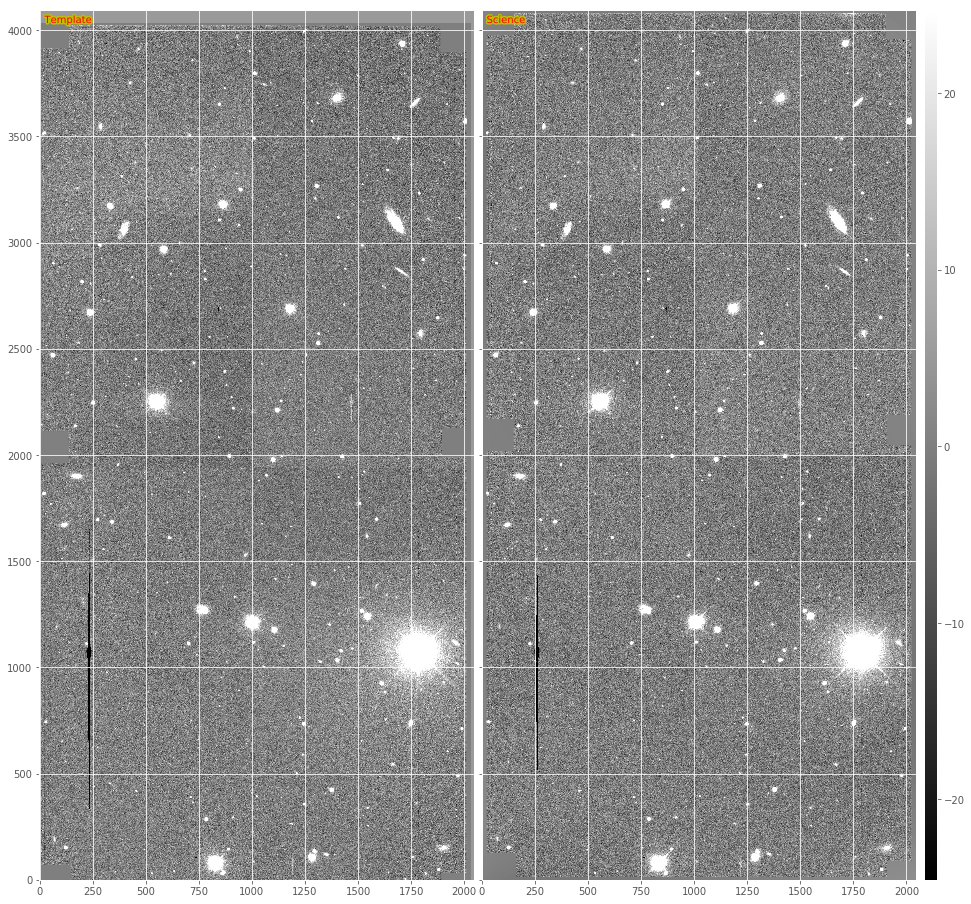

In [278]:
print dit.computeClippedImageStats(ga(template))
print dit.computeClippedImageStats(gv(template))
print dit.computeClippedImageStats(ga(science))
print dit.computeClippedImageStats(gv(science))

ga(template)[:, :] -= dit.computeClippedImageStats(ga(template)).mean
ga(science)[:, :] -= dit.computeClippedImageStats(ga(science)).mean
print dit.computeClippedImageStats(ga(template))
print dit.computeClippedImageStats(ga(science))

dit.plotImageGrid((ga(template), ga(science)), imScale=16, titles=['Template', 'Science'])

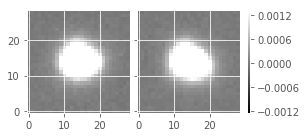

In [192]:
dit.plotImageGrid((science.getPsf().computeKernelImage().getArray(),
                   template.getPsf().computeKernelImage().getArray()))

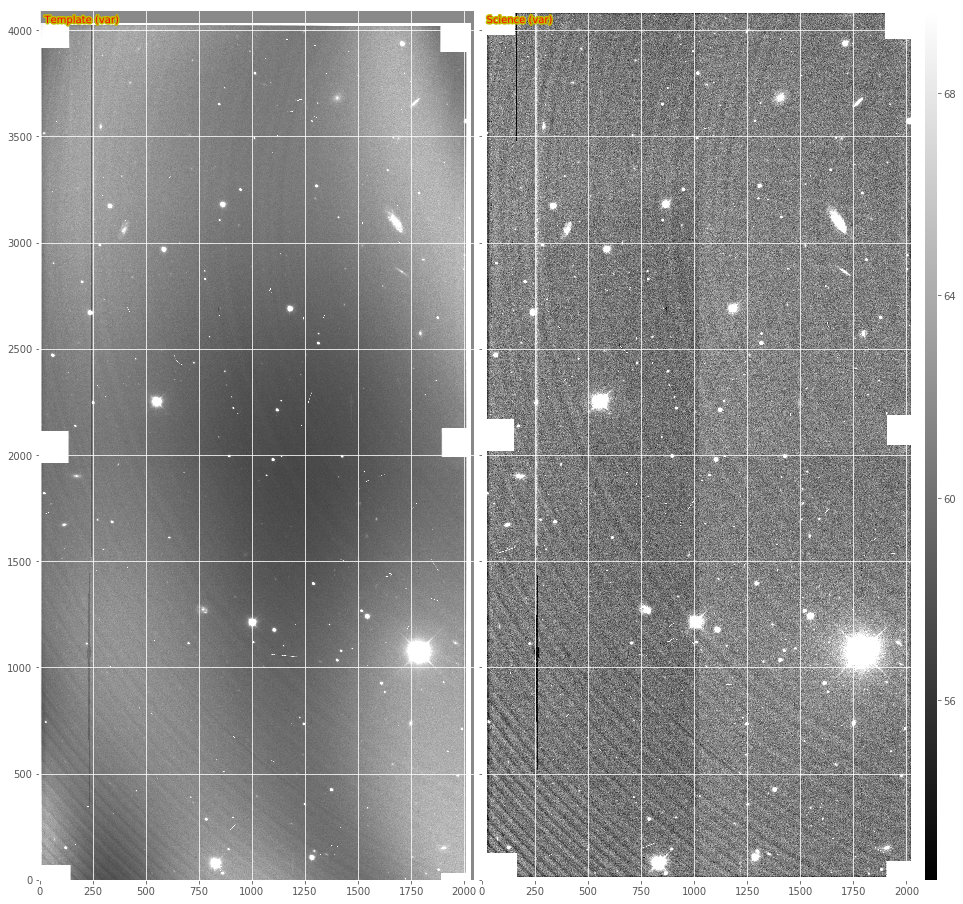

In [279]:
dit.plotImageGrid((gv(template), gv(science)), titles=['Template (var)', 'Science (var)'],
                  imScale=16)

In [194]:
config = ipDiffim.ZogyConfig()
task = ipDiffim.ZogyTask(templateExposure=template, scienceExposure=science, config=config)

In [195]:
D = task.computeDiffim(inImageSpace=False)

In [197]:
alDiffim = afwImage.ExposureF('/Users/dreiss/DATA/HiTS_from_meredith/diffim_15A38_g/deepDiff/v411033/diffexp-03.fits')

stats(mean=-0.13448687, stdev=7.0789409, min=-9354.957, max=33634.059)
stats(mean=-0.25267488, stdev=7.5227709, min=-8829.3809, max=32037.512)
stats(mean=110.82829, stdev=5.9135437, min=-141.63298, max=15802.479)


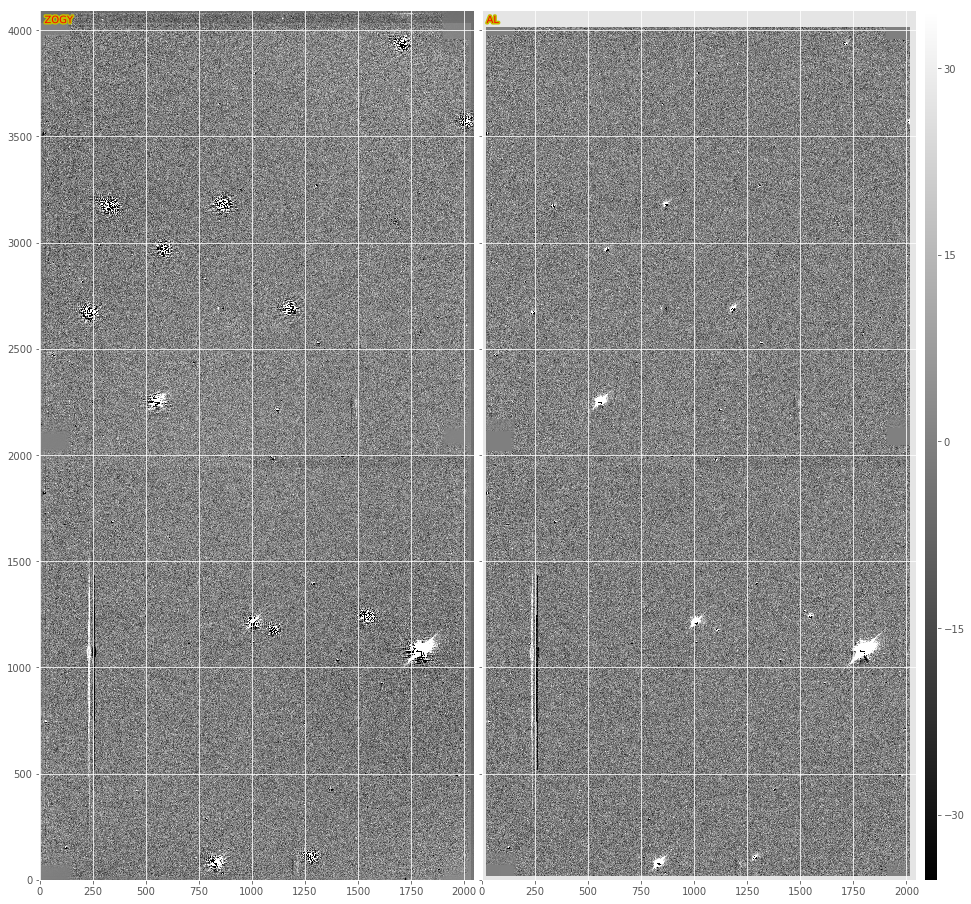

In [198]:
print dit.computeClippedImageStats(ga(D))
print dit.computeClippedImageStats(ga(alDiffim))
print dit.computeClippedImageStats(gv(D))
dit.plotImageGrid((ga(D), ga(alDiffim)), imScale=16, titles=['ZOGY', 'AL'])  # gv(D)

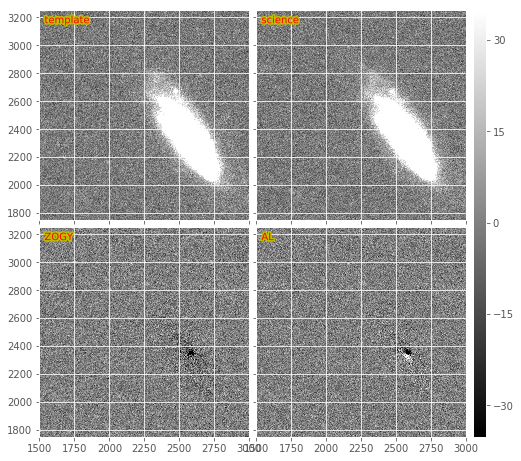

In [202]:
dit.plotImageGrid((ga(template)[3000:3250, 1500:1750], ga(science)[3000:3250, 1500:1750], 
                   ga(D)[3000:3250, 1500:1750], ga(alDiffim)[3000:3250, 1500:1750]), imScale=4, 
                  extent=(1500, 3000, 1750, 3250),
                 titles=['template', 'science', 'ZOGY', 'AL'])  # gv(D)

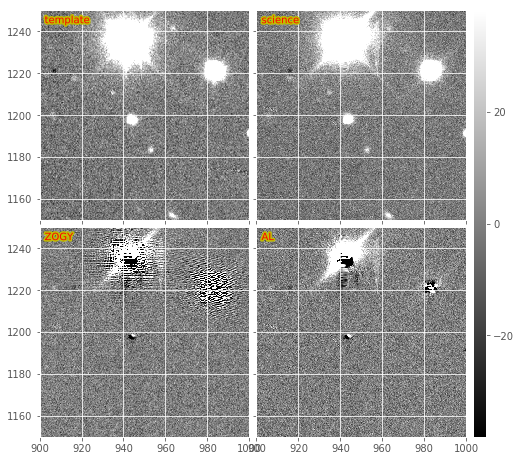

In [203]:
dit.plotImageGrid((ga(template)[1000:1250, 900:1150], ga(science)[1000:1250, 900:1150], 
                   ga(D)[1000:1250, 900:1150], ga(alDiffim)[1000:1250, 900:1150]), imScale=4, 
                  extent=(900, 1000, 1150, 1250),
                 titles=['template', 'science', 'ZOGY', 'AL'])  # gv(D)

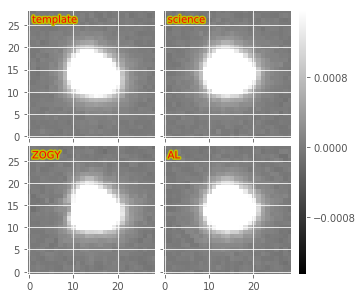

In [204]:
dit.plotImageGrid((
    template.getPsf().computeKernelImage().getArray(),
    science.getPsf().computeKernelImage().getArray(),
    D.getPsf().computeKernelImage().getArray(), 
    alDiffim.getPsf().computeKernelImage().getArray()),
    titles=['template', 'science', 'ZOGY', 'AL'], imScale=2.5)

In [205]:
S = task.computeScorr(inImageSpace=False)

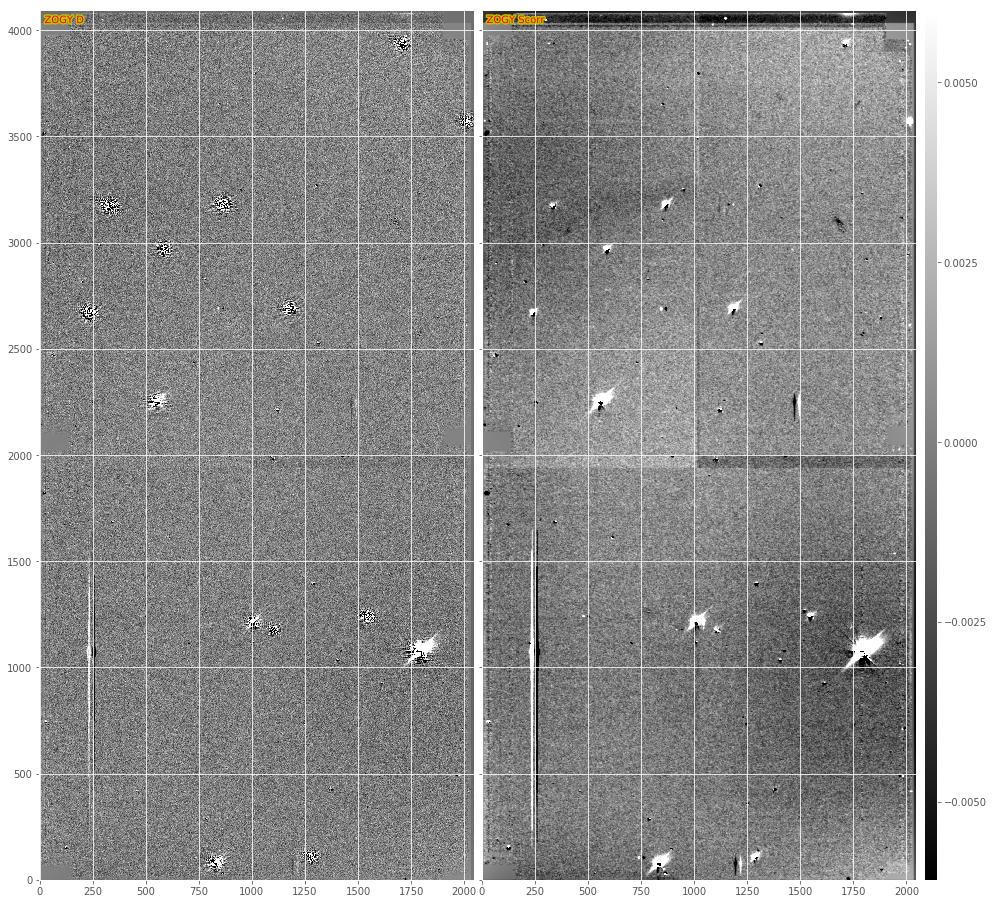

In [206]:
dit.plotImageGrid((ga(D), ga(S)), imScale=16, titles=['ZOGY D', 'ZOGY Scorr'])  # gv(D)

In [207]:
D2 = task.computeDiffim(inImageSpace=True)

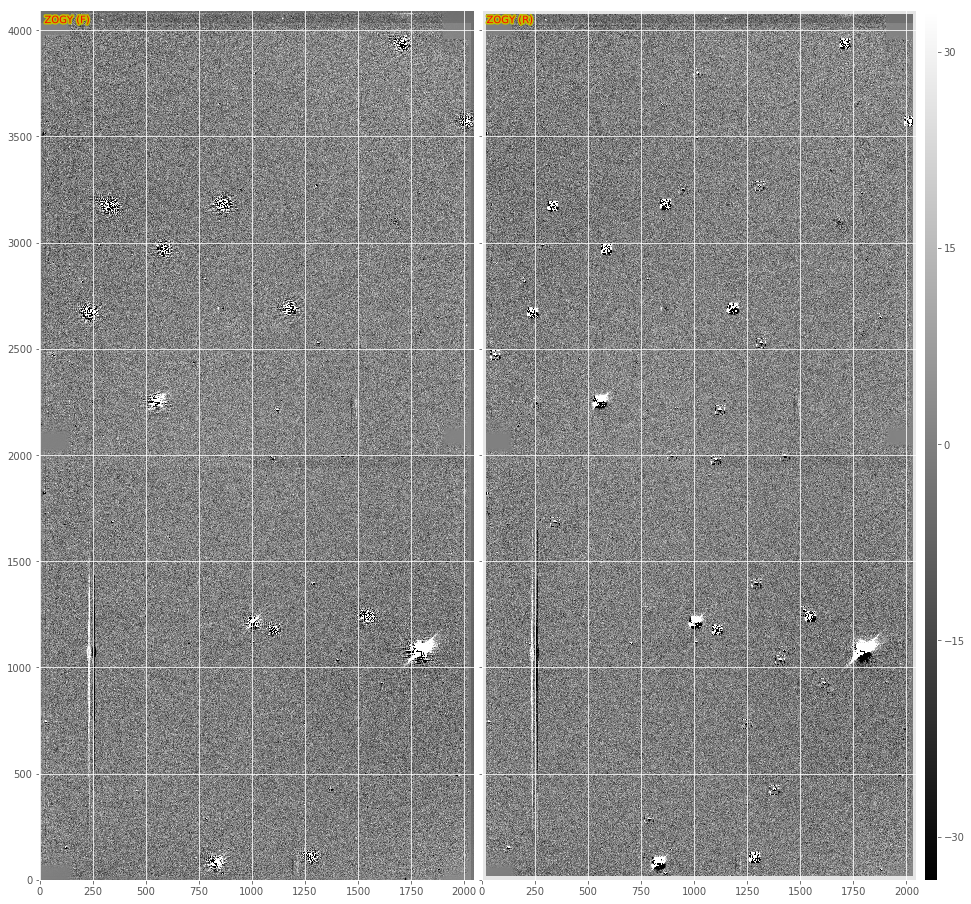

In [208]:
dit.plotImageGrid((ga(D), ga(D2)), imScale=16, titles=['ZOGY (F)', 'ZOGY (R)'])  # gv(D)

Now try imageMapReduce on it...

In [209]:
config = ipDiffim.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
config.gridSizeX = config.gridSizeY = 20
config.borderSizeX = config.borderSizeY = 6
config.reducerSubtask.reduceOperation = 'average'
task = ipDiffim.ImageMapReduceTask(config=config)
print config

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {'inImageSpace': False, 'templateFluxScaling': 1.0, 'doFilterKernels': False, 'padSize': 7, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE'], 'scienceFluxScaling': 1.0, 'doFilterPsfs': True}, 'returnSubImages': False, 'gridSizeX': 20.0, 'gridSizeY': 20.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 6.0, 'borderSizeY': 6.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [210]:
DF = task.run(science, template=template, inImageSpace=False,
             doScorr=False, forceEvenSized=True).exposure

Grid parameters: 89 89 38.26171875 78.26171875 27 27


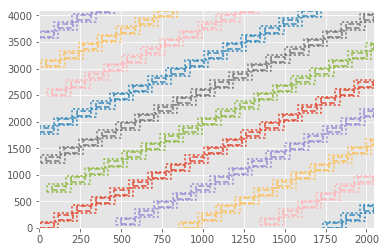

In [211]:
task.plotBoxes(science.getBBox(), skip=23)

stats(mean=-0.13448687, stdev=7.0789409, min=-9354.957, max=33634.059)
stats(mean=-0.11386731, stdev=7.1205812, min=-9409.1426, max=32238.127)


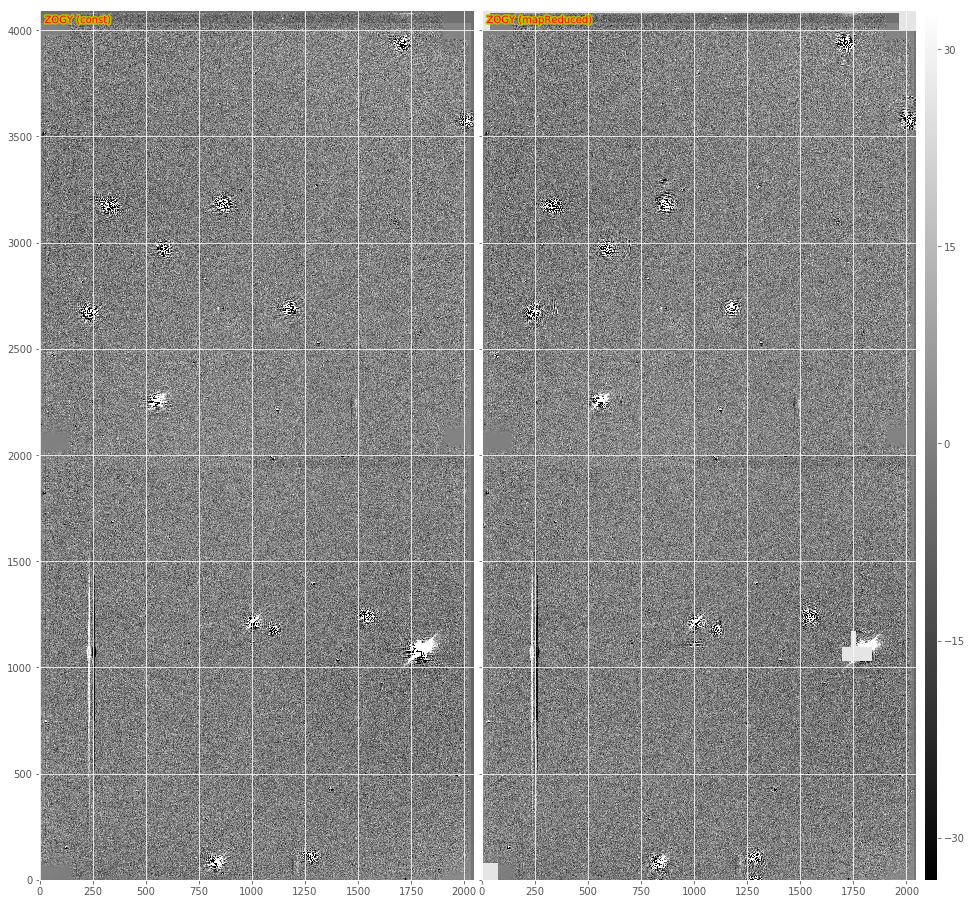

In [212]:
print dit.computeClippedImageStats(ga(D))
print dit.computeClippedImageStats(ga(DF))
dit.plotImageGrid((ga(D), ga(DF)), imScale=16, titles=['ZOGY (const)', 'ZOGY (mapReduced)'])

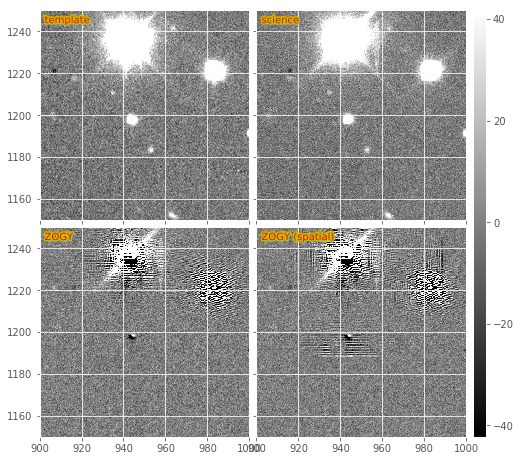

In [280]:
dit.plotImageGrid((ga(template)[1000:1250, 900:1150], ga(science)[1000:1250, 900:1150], 
                   ga(D)[1000:1250, 900:1150], ga(DF)[1000:1250, 900:1150]), imScale=4, 
                  extent=(900, 1000, 1150, 1250),
                titles=['template', 'science', 'ZOGY', 'ZOGY (spatial)'])

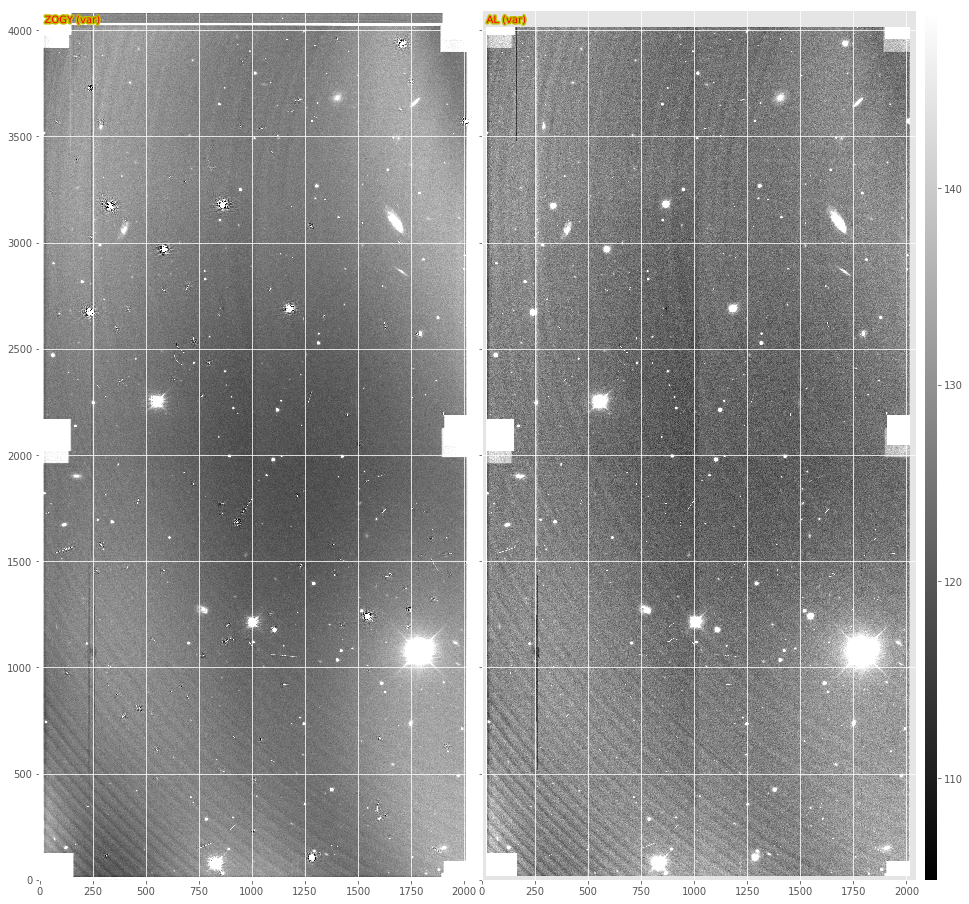

In [214]:
dit.plotImageGrid((gv(D), gv(alDiffim)), imScale=16, titles=['ZOGY (var)', 'AL (var)'])

stats(mean=-0.13448687, stdev=7.0789409, min=-9354.957, max=33634.059)
stats(mean=-0.11386731, stdev=7.1205812, min=-9409.1426, max=32238.127)
stats(mean=-0.25267488, stdev=7.5227709, min=-8829.3809, max=32037.512)
stats(mean=-0.00084792887, stdev=4.7236719, min=-2690.9414, max=3146.9268)
stats(mean=0.22700831, stdev=8.414835, min=-6227.6807, max=6312.8018)
stats(mean=0.23052557, stdev=8.3218727, min=-6564.8774, max=6827.4033)


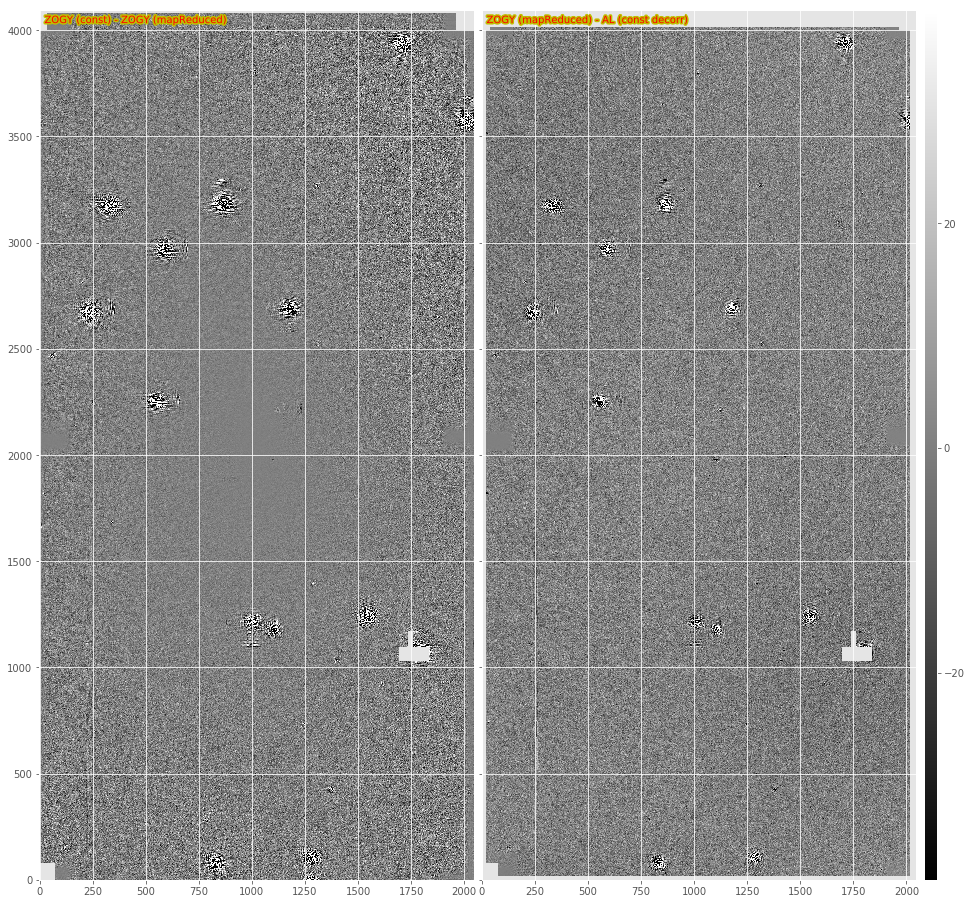

In [215]:
print dit.computeClippedImageStats(ga(D))
print dit.computeClippedImageStats(ga(DF))
print dit.computeClippedImageStats(ga(alDiffim))
print dit.computeClippedImageStats(ga(D) - ga(DF))
print dit.computeClippedImageStats(ga(D) - ga(alDiffim))
print dit.computeClippedImageStats(ga(DF) - ga(alDiffim))
dit.plotImageGrid((ga(D) - ga(DF), ga(DF) - ga(alDiffim),), imScale=16, 
                   titles=['ZOGY (const) - ZOGY (mapReduced)',
                          'ZOGY (mapReduced) - AL (const decorr)'])

-29.406024076 29.1651619896


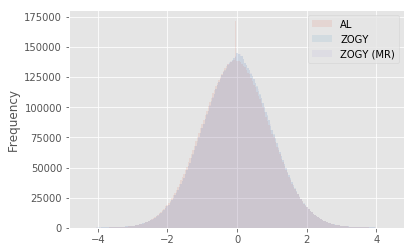

In [219]:
d1 = ga(D)
d2 = ga(alDiffim)
d3 = ga(DF)
# The ZOGY diffim has artefacts on the edges. Let's set them to zero so they dont mess up the stats.
# Actually, let's just set the edge pixels of both diffims to zero.
d1[0,:] = d1[:,0] = d1[-1,:] = d1[:,-1] = 0.
d2[0,:] = d2[:,0] = d2[-1,:] = d2[:,-1] = 0.
d3[0,:] = d3[:,0] = d3[-1,:] = d3[:,-1] = 0.
d1[np.isnan(d1)|np.isnan(d2)|np.isnan(d3)] = 0.
d2[np.isnan(d2)|np.isnan(d1)|np.isnan(d3)] = 0.
d3[np.isnan(d2)|np.isnan(d1)|np.isnan(d3)] = 0.

import scipy.stats
import pandas as pd
_, low, upp = scipy.stats.sigmaclip([d1, d2, d3])
print low, upp
low *= 1.1
upp *= 1.1
d1a = d1[(d1>low) & (d1<upp) & (d2>low) & (d2<upp) & (d3>low) & (d3<upp) & 
         (d1!=0.) & (d2!=0.) & (d3!=0.)]
d2a = d2[(d1>low) & (d1<upp) & (d2>low) & (d2<upp) & (d3>low) & (d3<upp) &
         (d1!=0.) & (d2!=0.) & (d3!=0.)]
d3a = d3[(d1>low) & (d1<upp) & (d2>low) & (d2<upp) & (d3>low) & (d3<upp) &
         (d1!=0.) & (d2!=0.) & (d3!=0.)]
df = pd.DataFrame({'ZOGY': d1a.flatten()/d1a.std(), 'AL': d2a.flatten()/d2a.std(),
                   'ZOGY (MR)': d3a.flatten()/d3a.std()})
df.plot.hist(alpha=0.1, bins=200)

Try to get grid of PSFs across image...

In [263]:
config = ipDiffim.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 100
config.gridSizeX = config.gridSizeY = 20
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'none'
config.returnSubImages = True
task = ipDiffim.ImageMapReduceTask(config=config)
print config

{'gridStepY': 100.0, 'gridStepX': 100.0, 'mapperSubtask': {'inImageSpace': False, 'templateFluxScaling': 1.0, 'doFilterKernels': False, 'padSize': 7, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE'], 'scienceFluxScaling': 1.0, 'doFilterPsfs': True}, 'returnSubImages': True, 'gridSizeX': 20.0, 'gridSizeY': 20.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'none'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [264]:
subims = task.run(science, template=template, inImageSpace=False,
             doScorr=False, forceEvenSized=True)
print len(subims.result)

Grid parameters: 89 89 423.748535156 866.748535156 13 13
25


In [265]:
res = subims.result[0]
res.getDict()

{'inputExpandedSubExposure': <lsst.afw.image.exposure.exposure.ExposureF at 0x1c3b2cca8>,
 'inputSubExposure': <lsst.afw.image.exposure.exposure.ExposureF at 0x1c3b4de30>,
 'subExposure': <lsst.afw.image.exposure.exposure.ExposureF at 0x26f4c3a40>}

In [270]:
def getPsfimgAtBoxCentroid(exposure):
    box = exposure.getBBox()
    psf = exposure.getPsf()
    centroid = ((box.getEndX() + box.getBeginX())/2., (box.getEndY() + box.getBeginY())/2.)
    coord = '%.1f,%.1f' % centroid
    img = psf.computeKernelImage(afwGeom.Point2D(centroid[0], centroid[1])).getArray()
    return img, coord

psfIms = [getPsfimgAtBoxCentroid(res.inputSubExposure)[0] for res in subims.result]
coords = [getPsfimgAtBoxCentroid(res.inputSubExposure)[1] for res in subims.result]
for im in psfIms:
    im[np.isnan(im)] = 0.

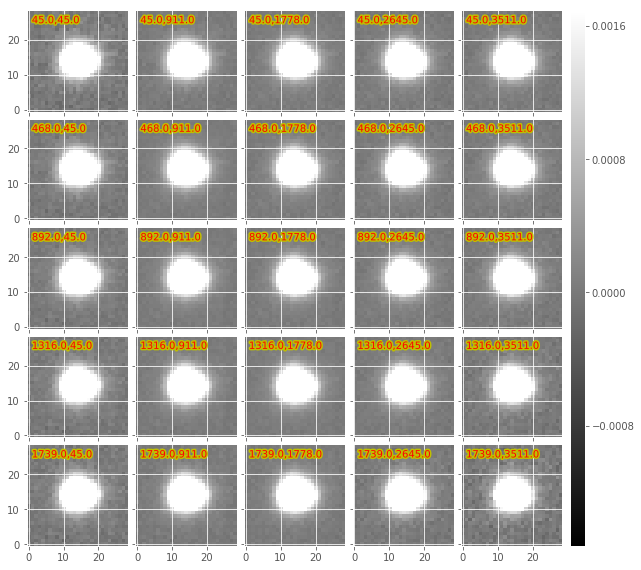

In [273]:
dit.plotImageGrid((psfIms), titles=coords)

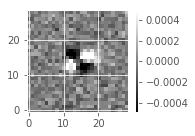

In [269]:
dit.plotImageGrid((psfIms[0] - psfIms[-1],))

In [274]:
psfIms = [getPsfimgAtBoxCentroid(res.subExposure)[0] for res in subims.result]
coords = [getPsfimgAtBoxCentroid(res.subExposure)[1] for res in subims.result]
for im in psfIms:
    im[np.isnan(im)] = 0.

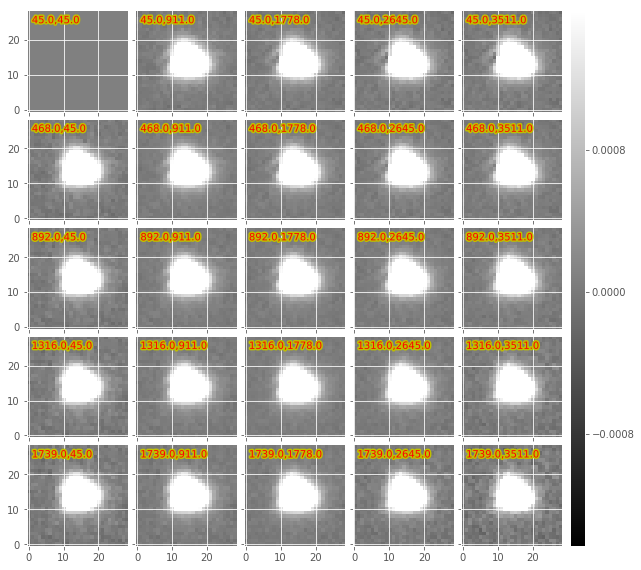

In [275]:
dit.plotImageGrid((psfIms), titles=coords)

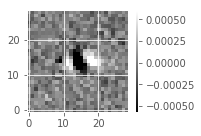

In [277]:
dit.plotImageGrid((psfIms[1] - psfIms[-1],))